In [1]:
#! pip install scikit-image

In [1]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()  # Disable TensorFlow 2.x behavior
#import tensorflow as tf
#tf.compat.v1.disable_eager_execution()

2024-06-27 16:45:18.861357: I tensorflow/core/platform/cpu_feature_guard.cc:194] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE3 SSE4.1 SSE4.2 AVX
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Instructions for updating:
non-resource variables are not supported in the long term


In [2]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import pickle

In [5]:
import sys
sys.path.append('./arl-eegmodels')
from EEGModels import EEGNet
from tensorflow.keras.models import Model
from src.deepexplain.deepexplain.tensorflow import DeepExplain
from tensorflow.keras import backend as K
from tensorflow.python.keras.backend import get_session

## Load results and dataframe

In [6]:
acc_crosssub = pickle.load(open('Acc_crosssub1.pkl', 'rb'))
#auc_crosssub= pickle.load(open('Auc_crosssub.pkl', 'rb'))

In [7]:
Dacchigh_df=pd.read_pickle('./Dacchigh_df1.pkl').reset_index(drop=True)
Dacchigh_df

,sub,accD,accM,acc_diff
0,25,0.503846,0.495000,0.008846
1,14,0.561364,0.488095,0.073268
2,47,0.505128,0.471250,0.033878
3,24,0.508621,0.442647,0.065974
4,30,0.547917,0.466667,0.081250
5,48,0.514516,0.496667,0.017849
6,41,0.561111,0.459524,0.101587
7,44,0.540000,0.494595,0.045405
8,29,0.529630,0.456452,0.073178
9,09,0.504545,0.501786,0.002760


In [8]:
sub_Dacchigh=list(Dacchigh_df['sub'].values)

In [9]:
Dacchigh_df['best_modelD']=0
Dacchigh_df['best_accD']=0
for s in sub_Dacchigh:
    best_modelD=np.argmax(acc_crosssub[s]['D'])
    best_accD=max(acc_crosssub[s]['D'])
    idx=Dacchigh_df[Dacchigh_df['sub']==s].index
    Dacchigh_df['best_modelD'][idx]=best_modelD
    Dacchigh_df['best_accD'][idx]=best_accD

In [10]:
Dacchigh_df

,sub,accD,accM,acc_diff,best_modelD,best_accD
0,25,0.503846,0.495000,0.008846,7,0.589744
1,14,0.561364,0.488095,0.073268,4,0.659091
2,47,0.505128,0.471250,0.033878,5,0.576923
3,24,0.508621,0.442647,0.065974,6,0.603448
4,30,0.547917,0.466667,0.081250,5,0.604167
5,48,0.514516,0.496667,0.017849,2,0.629032
6,41,0.561111,0.459524,0.101587,2,0.629630
7,44,0.540000,0.494595,0.045405,4,0.600000
8,29,0.529630,0.456452,0.073178,0,0.648148
9,09,0.504545,0.501786,0.002760,8,0.659091


## Load test subject's data & explain the model

In [11]:
nb_classes=2
dropoutRate=0.17 # change to 0?
kernLength=64
F1=8
D=2
F2=F1*D
norm_rate=0.25
dropoutType = 'Dropout'
#batch_size = 16
#epoch_no=200

In [12]:
tt=Dacchigh_df['best_modelD'][1]
s=Dacchigh_df['sub'][1]

In [13]:
data_path='./eeg_sub_128_10-18/'
XD_test=np.load(data_path+'XD_'+s+'.npy')
y_encodedD_test=np.load(data_path+'y_encodedD_'+s+'.npy')

In [14]:
kernels, chans, samples = 1, XD_test.shape[1], XD_test.shape[2]
XD_test=XD_test.reshape(XD_test.shape[0], chans, samples, kernels)

In [15]:
model=EEGNet(nb_classes=nb_classes,Chans=chans,Samples=samples,dropoutRate=dropoutRate,
                    kernLength=kernLength,F1=F1,D=D,F2=F2,norm_rate=norm_rate,dropoutType=dropoutType)
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam')
model.load_weights('./checkpoint_model1/Model'+str(tt)+'_'+s+'D.h5')

Instructions for updating:
Colocations handled automatically by placer.


2024-06-27 16:49:25.679757: I tensorflow/core/platform/cpu_feature_guard.cc:194] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE3 SSE4.1 SSE4.2 AVX
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-27 16:49:25.814260: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1621] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38319 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-40GB, pci bus id: 0000:bd:00.0, compute capability: 8.0
2024-06-27 16:49:25.844361: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:357] MLIR V1 optimization pass is not enabled
2024-06-27 16:49:26.269353: W tensorflow/c/c_api.cc:291] Operation '{name:'dense/bias/Assign' id:317 op device:{requested: '', assigned: ''} def:{{{node dense/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, val

In [16]:
X_test=XD_test
Y_test=y_encodedD_test

In [17]:
X_test.shape

(44, 128, 897, 1)

In [18]:
Y_test.shape

(44, 2)

In [19]:
sess = tf.Session()
get_session(sess)

2024-06-27 16:49:31.821588: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1621] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38319 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-40GB, pci bus id: 0000:bd:00.0, compute capability: 8.0
2024-06-27 16:49:31.827673: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1621] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38319 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-40GB, pci bus id: 0000:bd:00.0, compute capability: 8.0


In [20]:
input_tensor = model.layers[0].input
output_tensor = model.layers[-2].output

# Initialize variables
sess.run(tf.global_variables_initializer())

# Ensure intermediate model is correct
fModel = Model(inputs=input_tensor, outputs=output_tensor)
target_tensor = fModel.output

In [21]:
# Verify input_tensor and X_test consistency
print("Input tensor shape:", input_tensor.shape)
print("X_test shape:", X_test.shape)

Input tensor shape: (?, 128, 897, 1)
X_test shape: (44, 128, 897, 1)


In [22]:
with DeepExplain(session=sess) as de:
    #target_values = sess.run(target_tensor, feed_dict={input_tensor: X_test})
    attributions = de.explain('deeplift', target_tensor * Y_test, input_tensor, X_test)

sess.close()

2024-06-27 16:49:57.784807: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8700
2024-06-27 16:49:57.892424: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:648] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2024-06-27 16:49:58.036010: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:1014] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape indropout/cond/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


In [23]:
print("Attributions shape:", np.shape(attributions))

Attributions shape: (44, 128, 897, 1)


In [31]:
# Plot attributions
#from src.deepexplain.examples.utils import plot, plt
#import matplotlib.pyplot as plt
#%matplotlib inline

#y_predict=model.predict(XD_test)
#x=X_test[y_predict[:,1].argmax(),:,:]
#a=attributions[y_predict[:,1].argmax(),:,:]
#fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 20))
#plot(x, axis=axes[0]).set_title('Original')
#for i, method_name in enumerate(sorted(attributions.keys())):
#plot(a, axis=axes[1],cmap='rainbow').set_title('Explain')

In [61]:
# convert sample no. to time
sf=128
time=np.arange(a.shape[1])/sf

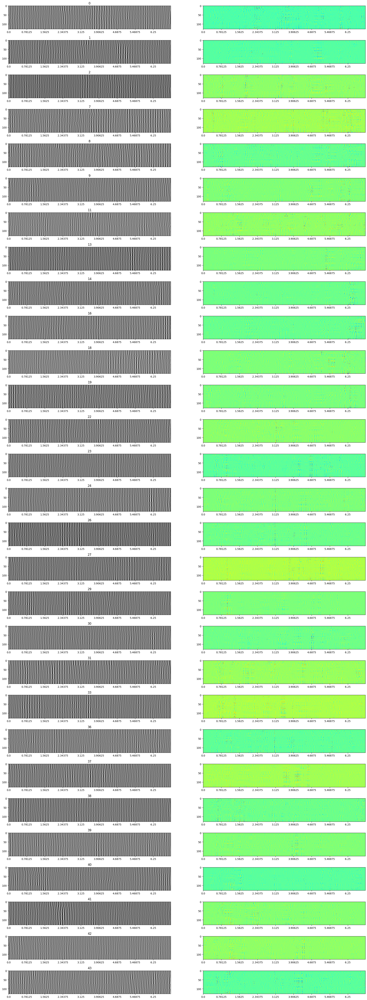

In [102]:
import matplotlib.pyplot as plt
%matplotlib inline

y_predict=model.predict(XD_test)
y_class=np.argmax(y_predict, axis=1)
y_true=np.argmax(y_encodedD_test, axis=1)
correct_idx=[i for i,j in enumerate(y_true) if y_class[i]==y_true[i]]

fig, axes = plt.subplots(len(correct_idx), 2, figsize=(25, 70))
axes=axes.ravel()
ax=0
for idx in correct_idx:

    x=X_test[idx,:,:]
    a=attributions[idx,:,:]
    
    axes[ax].imshow(x,cmap='gray')
    #axes[ax].set_ylabel('Channel')
    axes[ax].set_xticks(np.arange(0,a.shape[1],100),time[0::100])
    axes[ax].set_title(idx)
    #axes[ax].set_xlabel('Time (s)')

    axes[ax+1].imshow(a,cmap='jet')
    axes[ax+1].set_xticks(np.arange(0,a.shape[1],100),time[0::100])
    #axes[ax+1].set_xlabel('Time (s)')

    ax=ax+2
    
    